In [1]:
import numpy as np
import seaborn as sns

from zipfile import ZipFile
from matplotlib import pyplot as plt
from skimage.io import imread

from img_edit import auto_rotate_and_crop, best_rgb, rgb_to_color

sns.set_style(style='darkgrid')
plt.gray()

color_dict = {i:s for i, s in enumerate(['vermelho', 'verde', 'azul'])}

<Figure size 432x288 with 0 Axes>

In [2]:
path_list = []
with ZipFile('./toras.zip') as zip_file:
  for path in zip_file.namelist():
    if '__MAC' not in path \
        and '.JPG' in path:
      path_list.append(f'./toras.zip/{path}')

## Plotando somas horizontais e verticais de RGB sem rotação

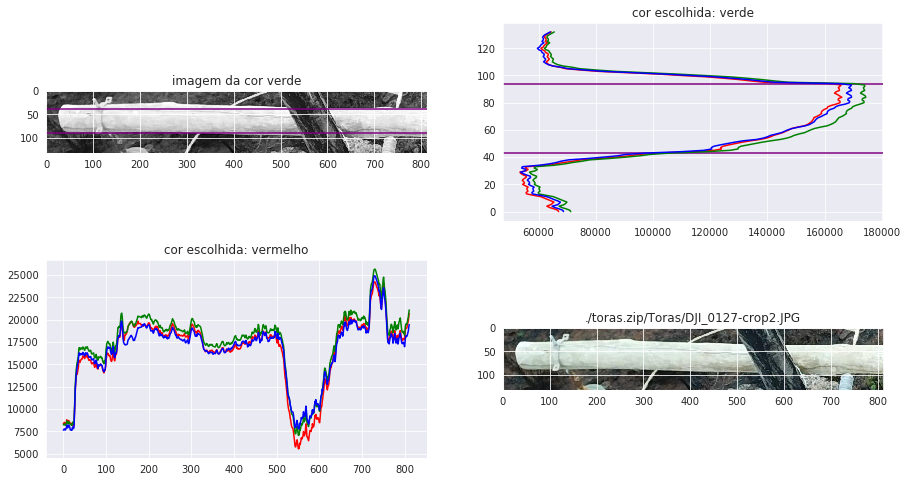

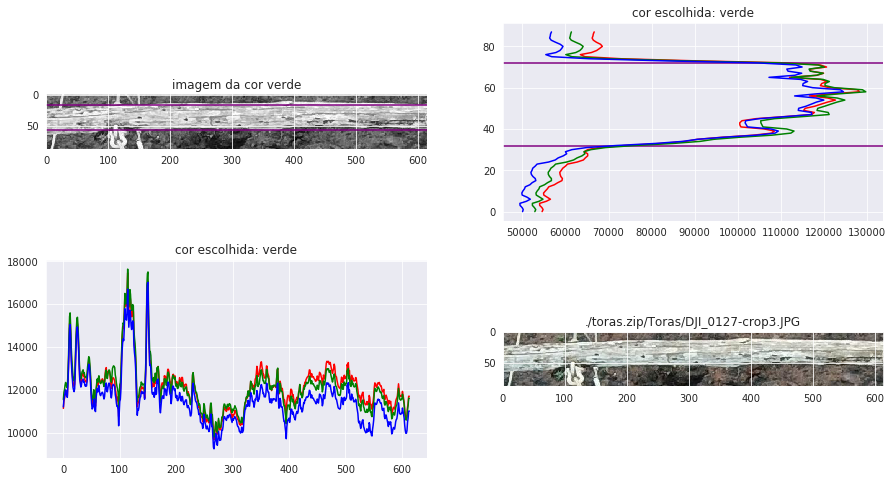

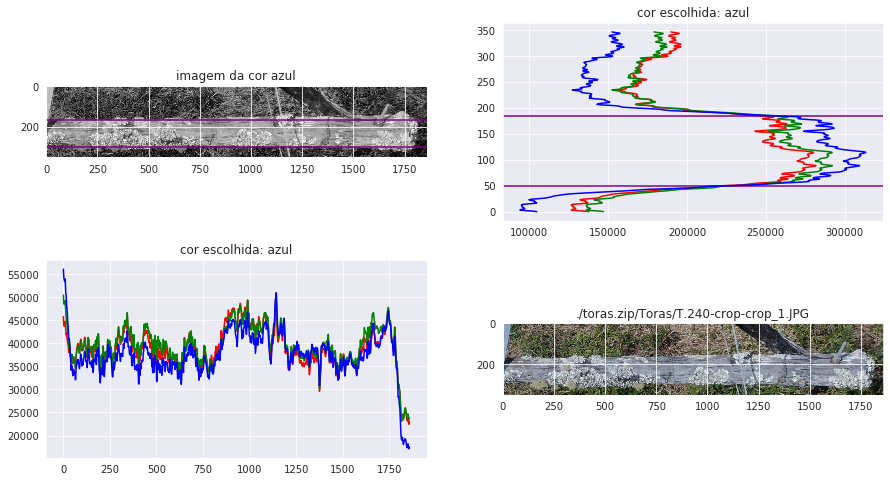

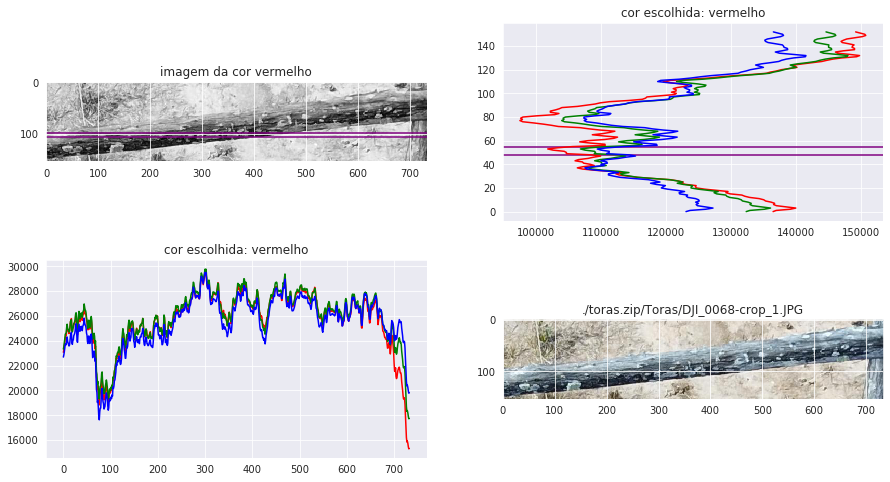

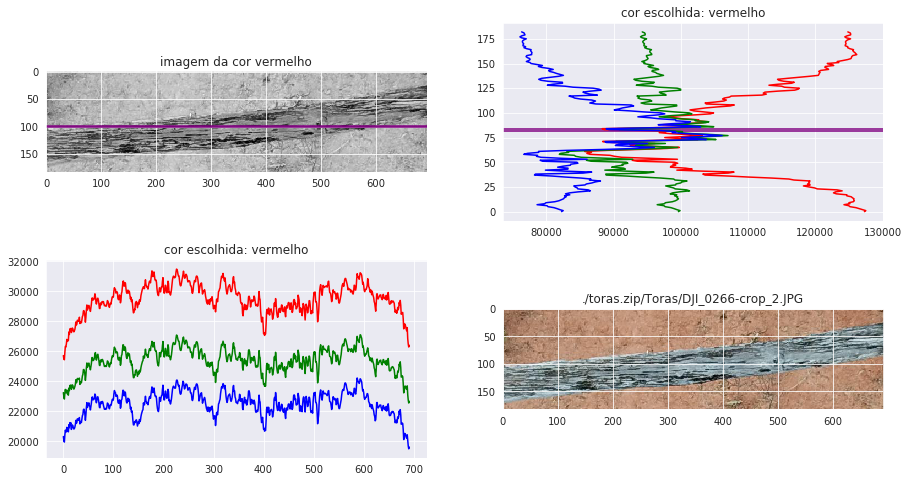

...

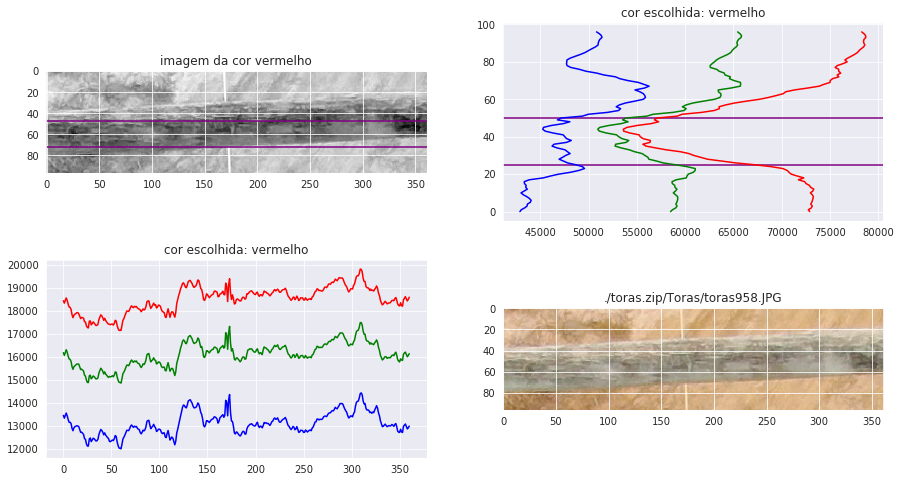

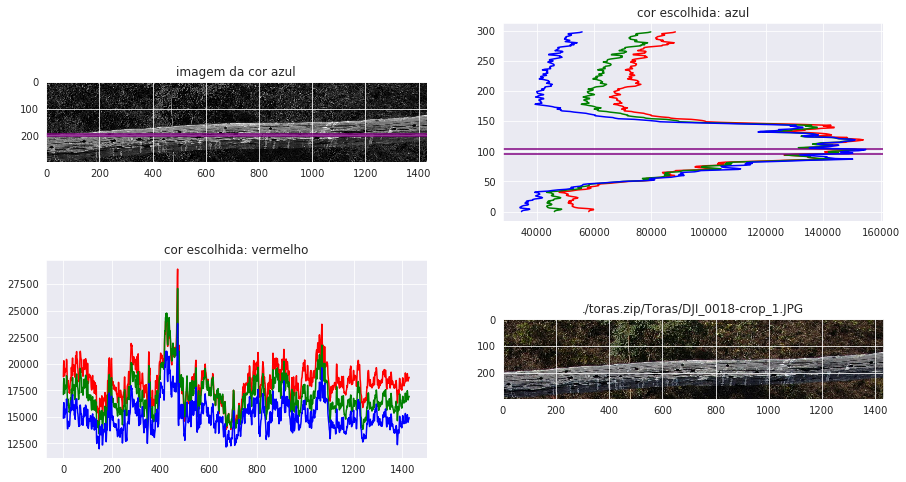

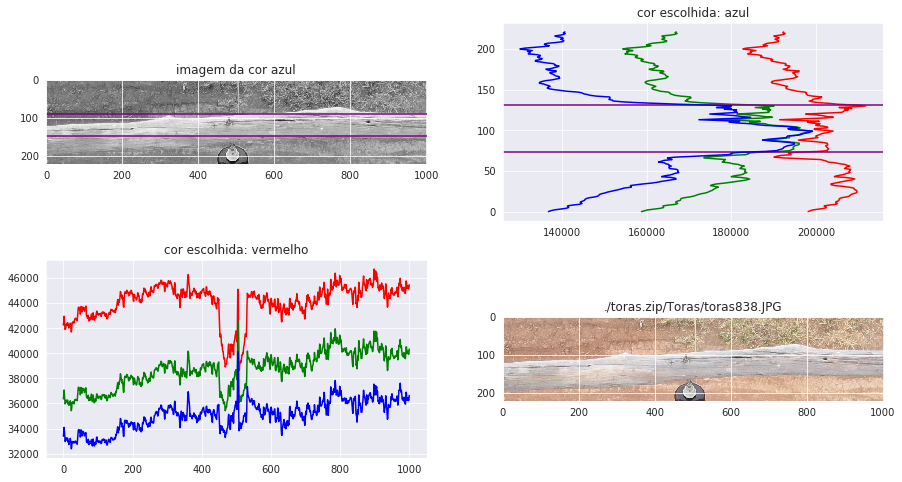

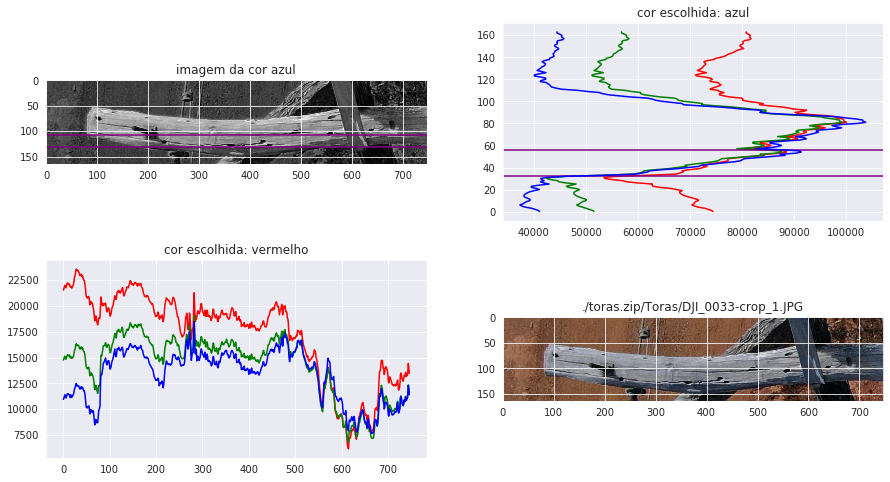

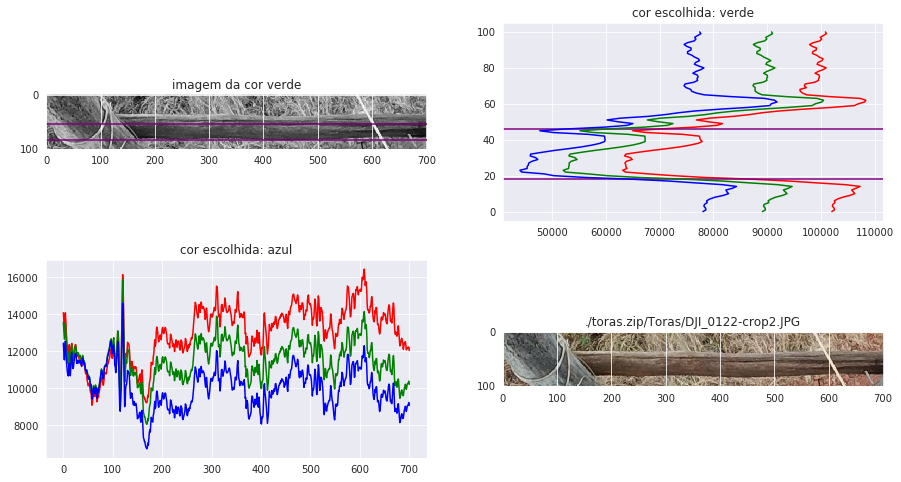

In [3]:
for path in path_list:
  # lendo imagem RGB
  img = imread(path)

  # Escolhendo qual cor apresenta maior variação
  cor_v, cor_h = best_rgb(img)

  # Plotando imagens
  fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(15, 8))
  ax[0, 1].title.set_text(f'cor escolhida: {color_dict[cor_h]}')
  ax[1, 0].title.set_text(f'cor escolhida: {color_dict[cor_v]}')
  
  # somas verticais e horizontais
  for i, cor in enumerate(['r-', 'g-', 'b-']):
    new_img = rgb_to_color(img, i)
    h, w = new_img.shape

    soma_vertical = new_img.sum(axis=0)
    soma_horizontal = new_img.sum(axis=1)

    # exibindo apenas a de maior variação horizontal
    if i == cor_h:
      ax[0, 0].title.set_text(f'imagem da cor {color_dict[i]}')
      ax[0, 0].imshow(new_img)

      diff_h = np.diff(soma_horizontal)
      maximo = max(diff_h)
      minimo = min(diff_h)
      for i, e in enumerate(diff_h[::-1]):
        if e == maximo or e == minimo:
          ax[0, 1].axhline(i, color='purple')
          ax[0, 0].axhline(h - i, color='purple')


    ax[0, 1].plot(soma_horizontal, range(h-1, -1, -1), cor)
    ax[1, 0].plot(range(w), soma_vertical, cor)

  # Imagem original
  ax[1, 1].title.set_text(path)
  ax[1, 1].imshow(img)

  plt.show()


## Plotando somas verticais e horizontais de RGB com rotação e crop

cor vermelho rotacionada em 0°
cor verde rotacionada em 0°
cor azul rotacionada em 0°


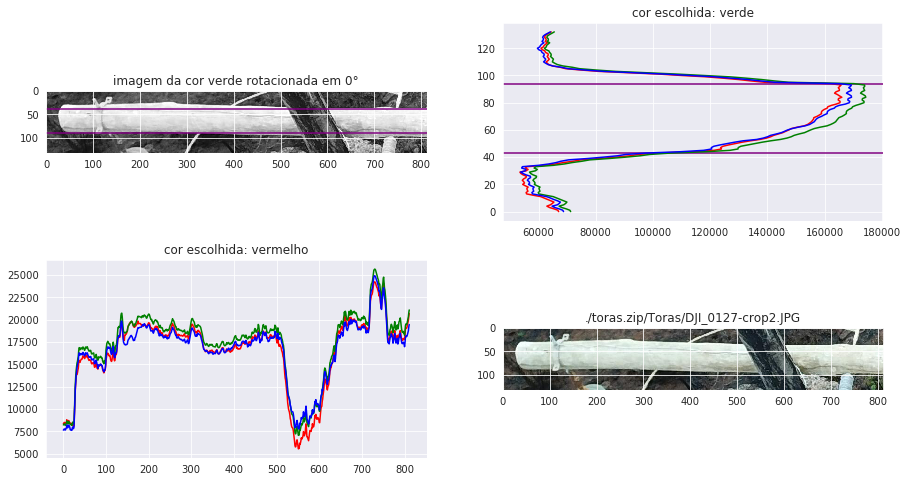

cor vermelho rotacionada em 1.0055865921787728°
cor verde rotacionada em -5.027932960893878°
cor azul rotacionada em -1.005586592178787°


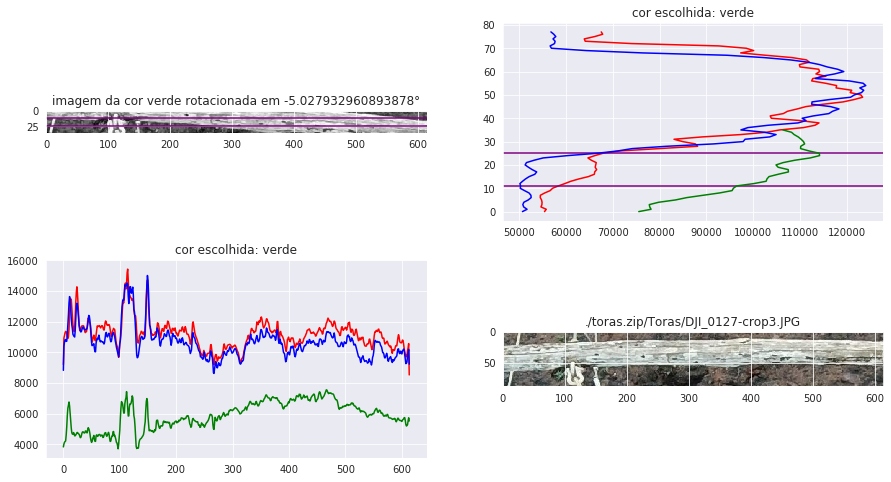

cor vermelho rotacionada em 1.0055865921787728°
cor verde rotacionada em 0°
cor azul rotacionada em 0°


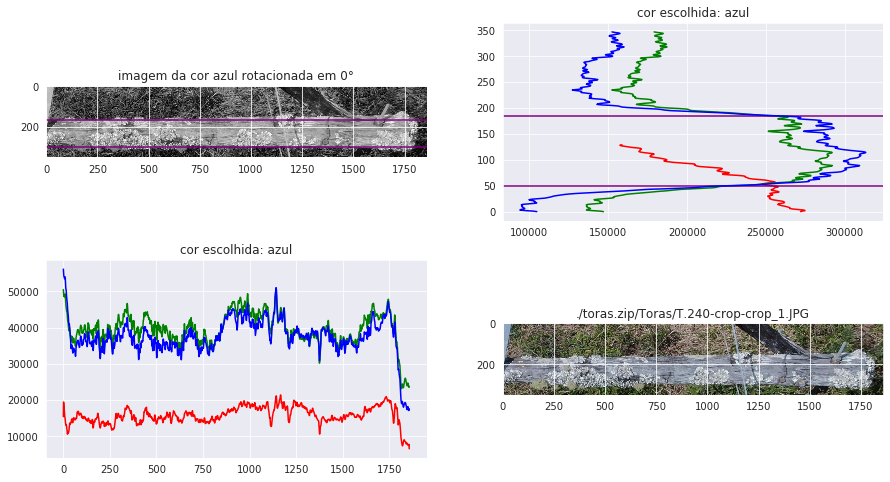

cor vermelho rotacionada em -8.044692737430196°
cor verde rotacionada em -7.039106145251395°
cor azul rotacionada em -6.033519553072637°


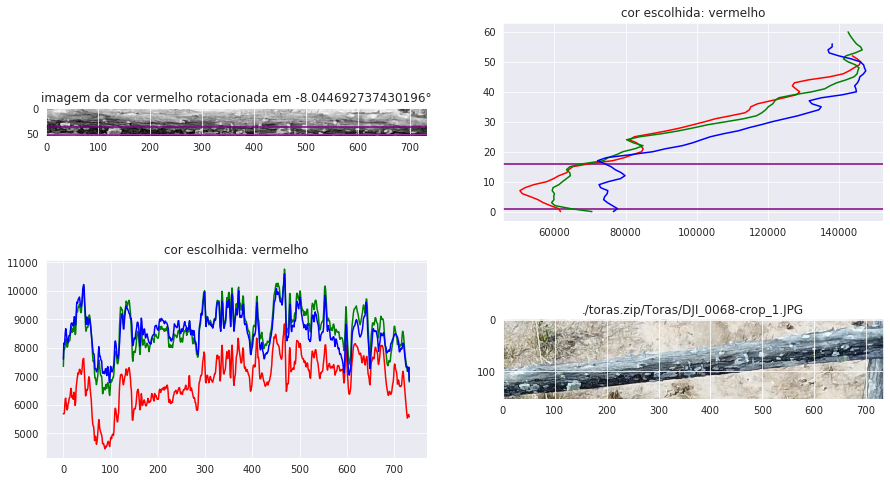

cor vermelho rotacionada em 0°
cor verde rotacionada em 1.0055865921787728°
cor azul rotacionada em -7.039106145251395°


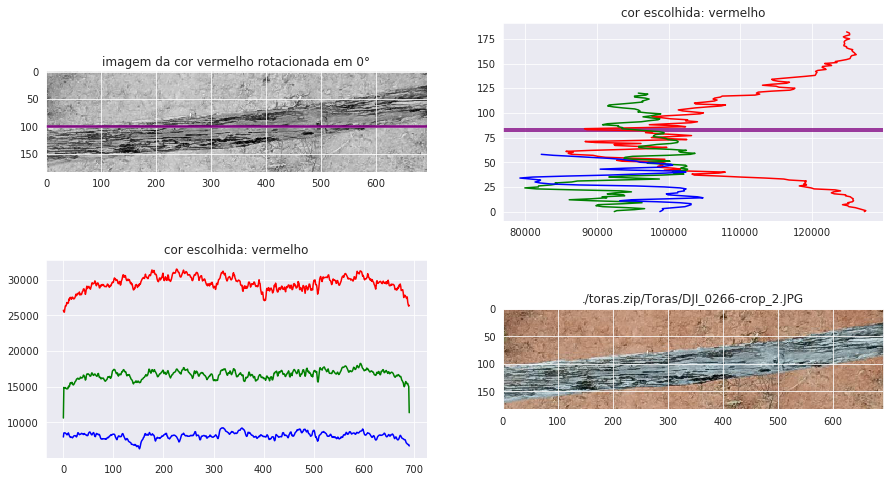

cor vermelho rotacionada em -6.033519553072637°
cor verde rotacionada em 0°
cor azul rotacionada em -3.0167597765363183°


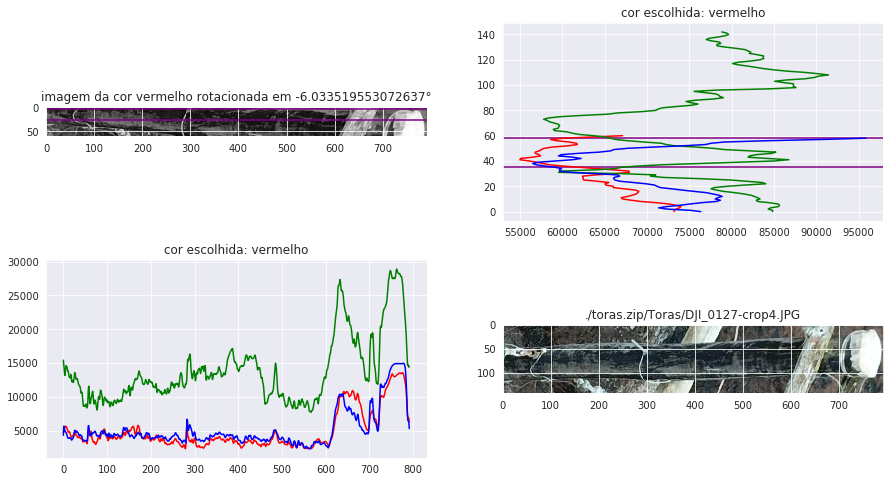

cor vermelho rotacionada em 5.027932960893864°
cor verde rotacionada em 14.078212290502805°
cor azul rotacionada em -3.0167597765363183°


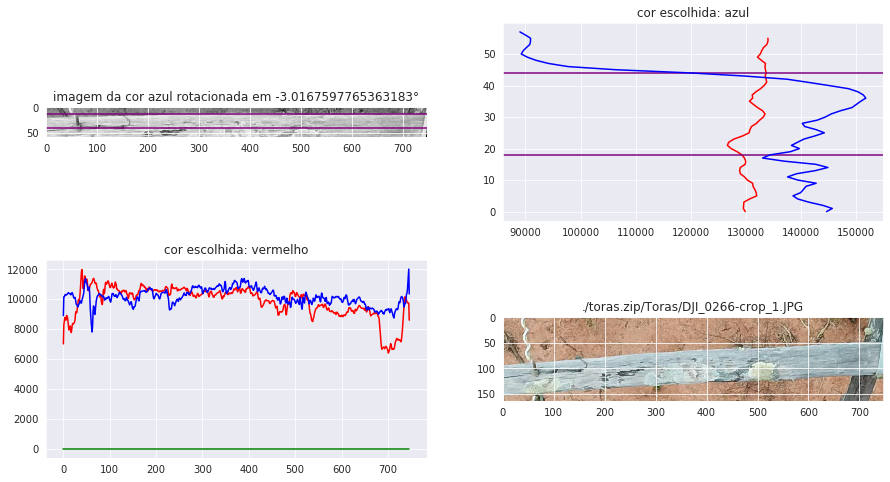

cor vermelho rotacionada em 0°
cor verde rotacionada em 1.0055865921787728°
cor azul rotacionada em 0°


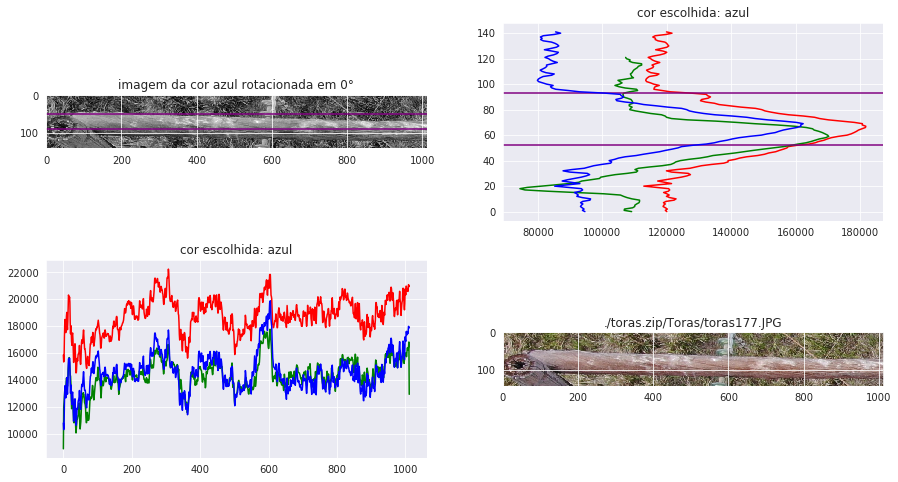

cor vermelho rotacionada em 7.039106145251395°
cor verde rotacionada em 4.022346368715077°
cor azul rotacionada em 4.022346368715077°


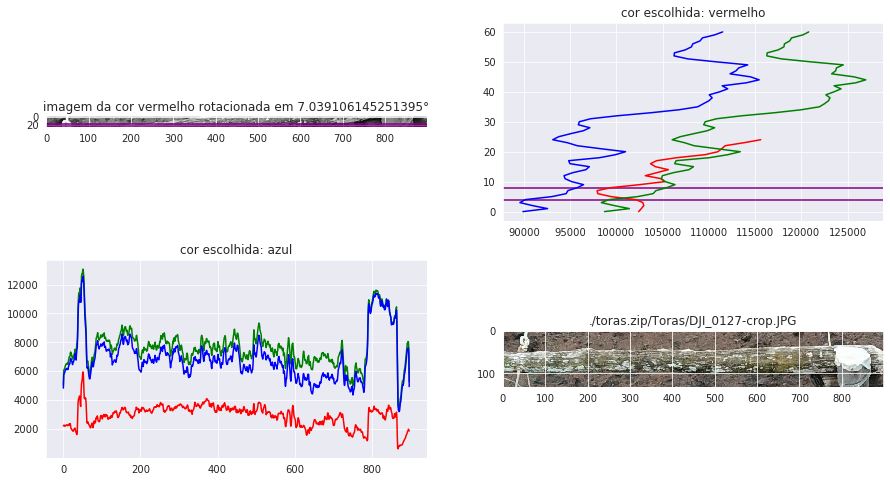

cor vermelho rotacionada em 1.0055865921787728°
cor verde rotacionada em 4.022346368715077°
cor azul rotacionada em 0°


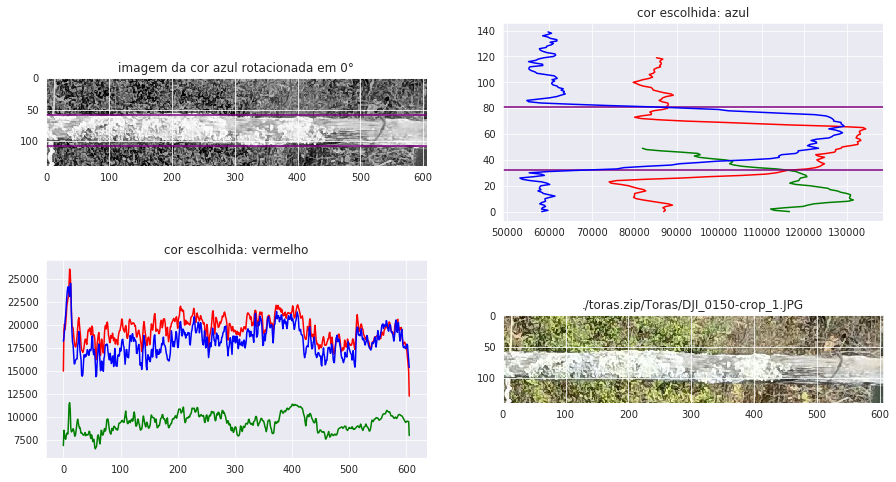

cor vermelho rotacionada em -1.005586592178787°
cor verde rotacionada em -2.0111731843575598°
cor azul rotacionada em -2.0111731843575598°


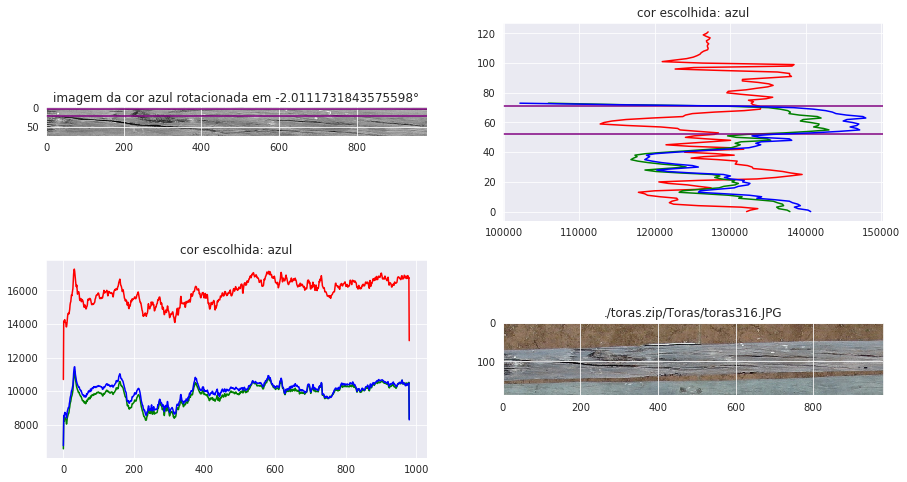

cor vermelho rotacionada em 0°
cor verde rotacionada em 0°
cor azul rotacionada em 0°


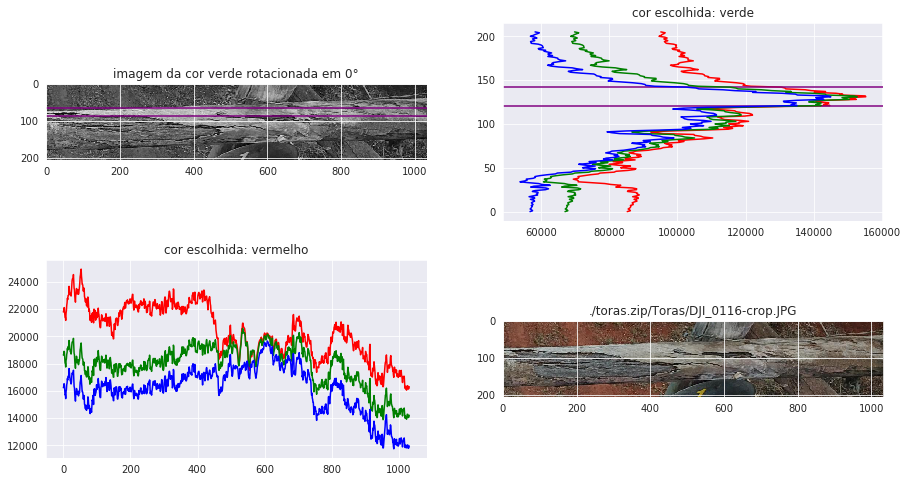

cor vermelho rotacionada em 3.0167597765363183°
cor verde rotacionada em 0°
cor azul rotacionada em 0°


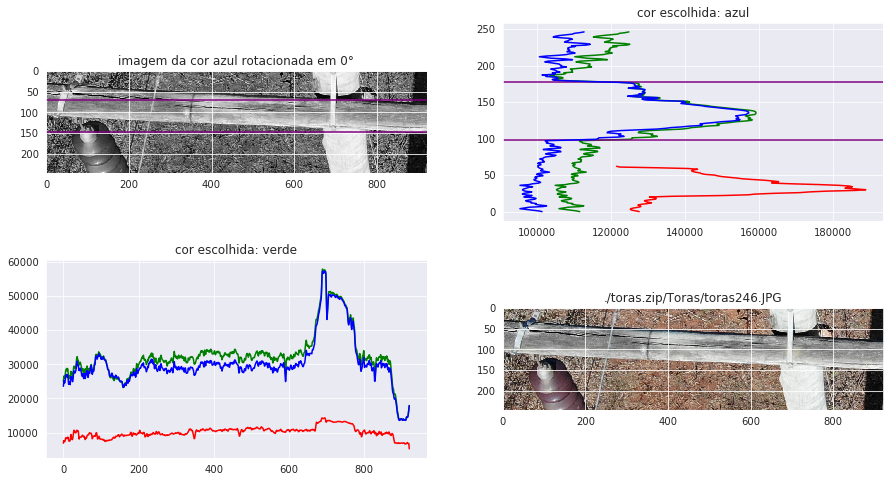

cor vermelho rotacionada em 1.0055865921787728°
cor verde rotacionada em 0°
cor azul rotacionada em 0°


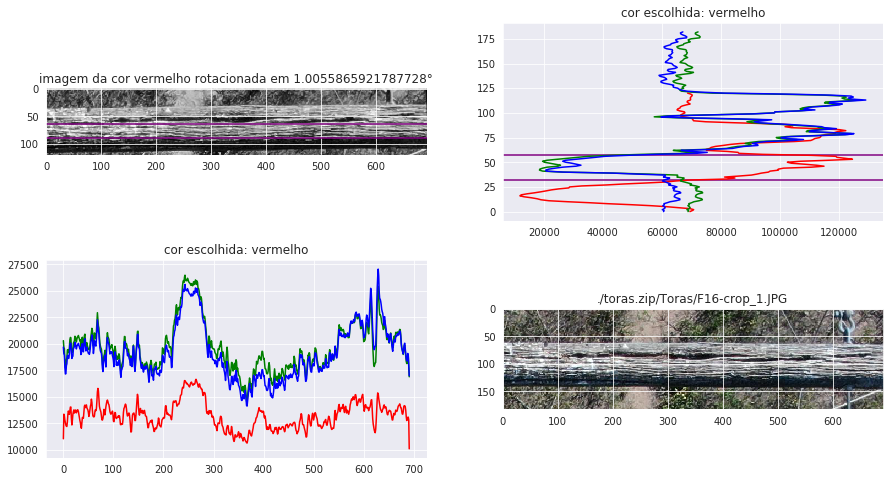

cor vermelho rotacionada em 4.022346368715077°
cor verde rotacionada em 1.0055865921787728°
cor azul rotacionada em 3.0167597765363183°


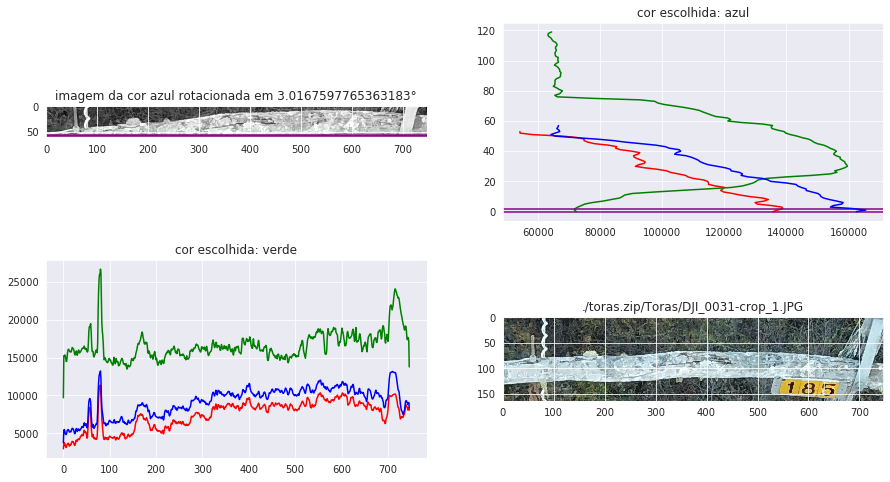

cor vermelho rotacionada em -1.005586592178787°
cor verde rotacionada em 1.0055865921787728°
cor azul rotacionada em 1.0055865921787728°


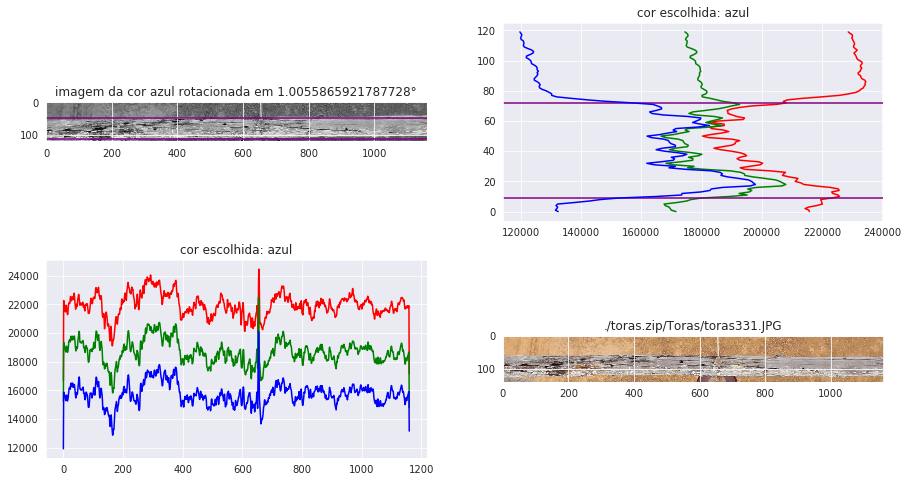

cor vermelho rotacionada em 0°
cor verde rotacionada em 3.0167597765363183°
cor azul rotacionada em 1.0055865921787728°


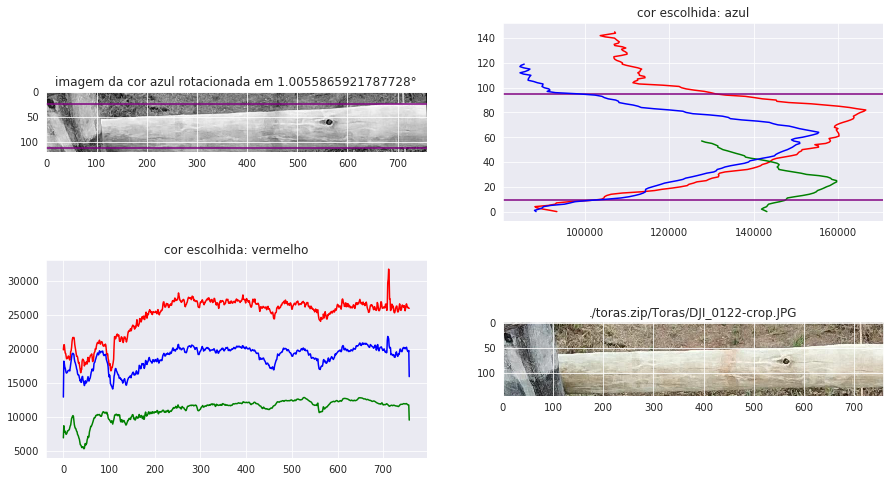

cor vermelho rotacionada em 0°
cor verde rotacionada em 0°
cor azul rotacionada em 0°


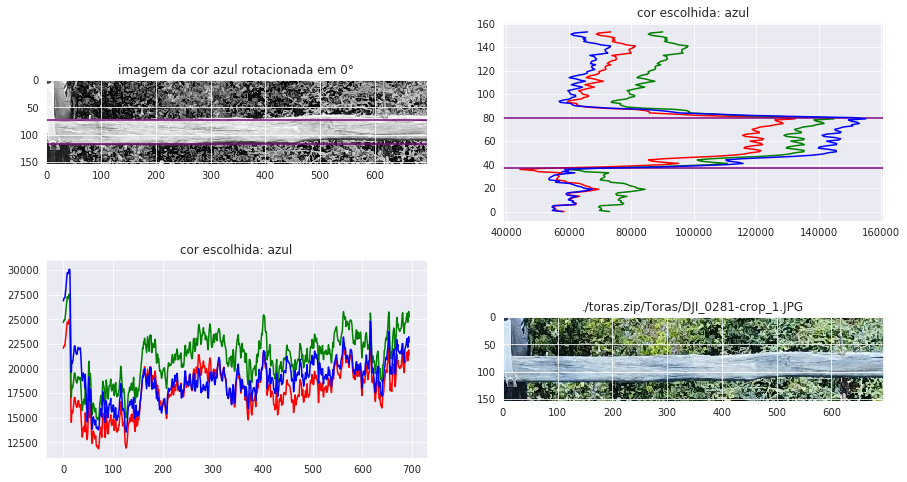

cor vermelho rotacionada em 2.0111731843575456°
cor verde rotacionada em 1.0055865921787728°
cor azul rotacionada em 1.0055865921787728°


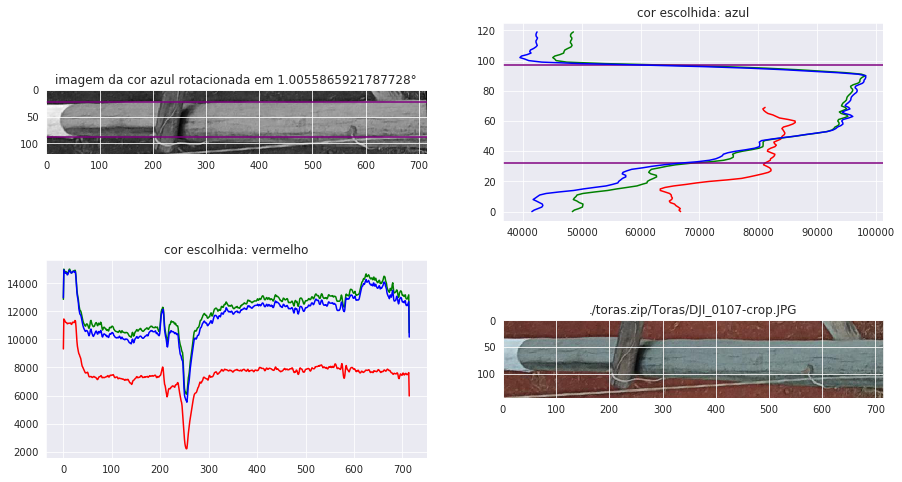

cor vermelho rotacionada em -4.022346368715105°
cor verde rotacionada em 0°
cor azul rotacionada em 1.0055865921787728°


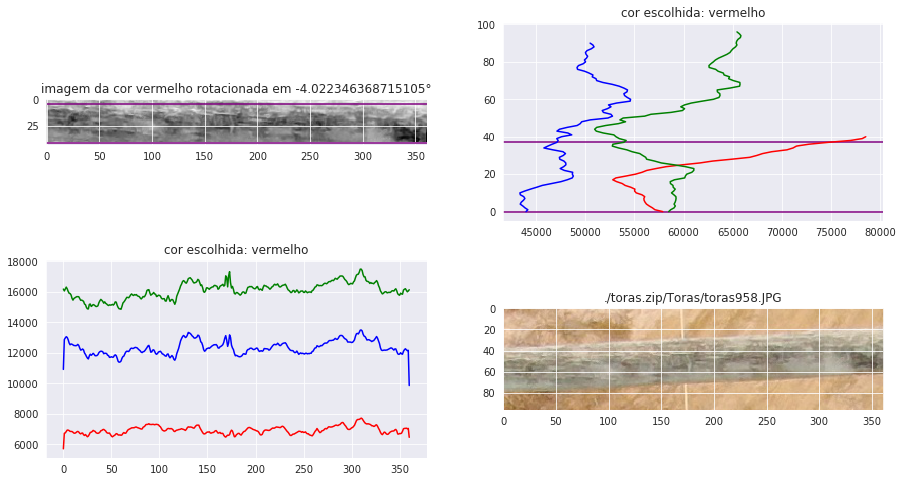

cor vermelho rotacionada em 0°
cor verde rotacionada em -1.005586592178787°
cor azul rotacionada em 1.0055865921787728°


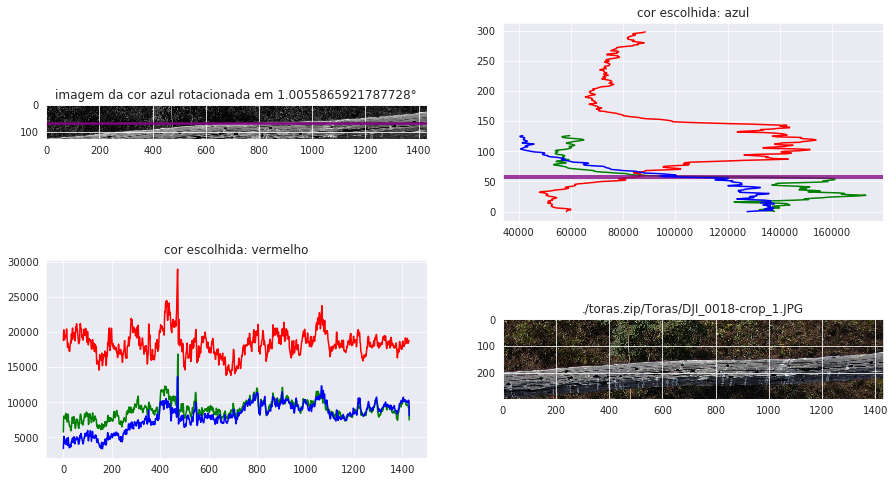

cor vermelho rotacionada em 0°
cor verde rotacionada em -2.0111731843575598°
cor azul rotacionada em 1.0055865921787728°


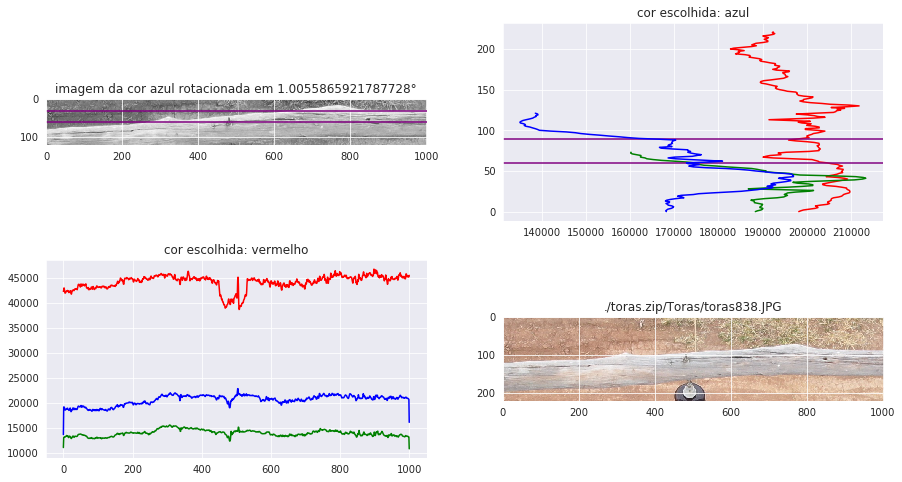

cor vermelho rotacionada em -5.027932960893878°
cor verde rotacionada em 7.039106145251395°
cor azul rotacionada em 1.0055865921787728°


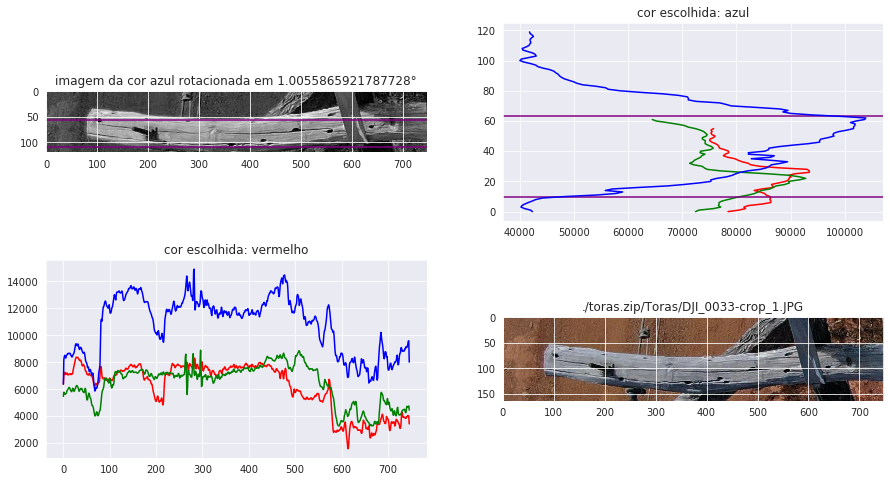

cor vermelho rotacionada em 1.0055865921787728°
cor verde rotacionada em 0°
cor azul rotacionada em 1.0055865921787728°


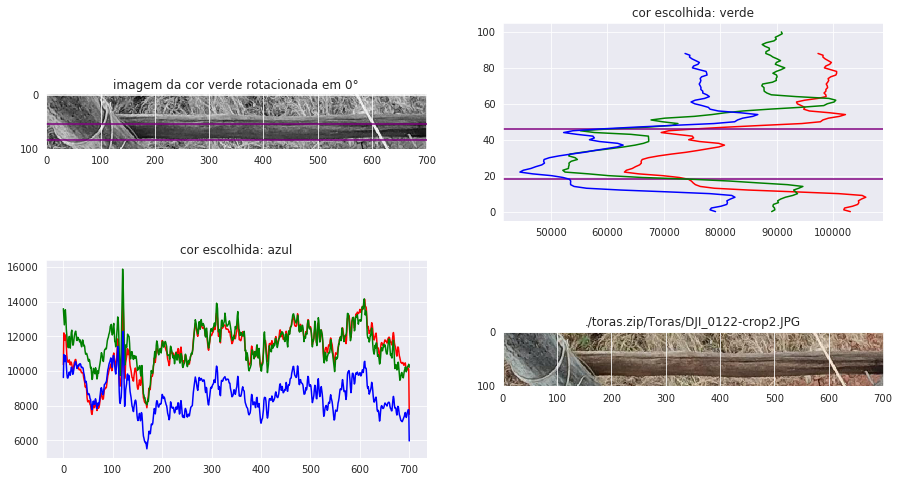

In [4]:

for path in path_list:
  # lendo imagem RGB
  img = imread(path)

  # Escolhendo qual cor apresenta maior variação
  cor_v, cor_h = best_rgb(img)

  # Plotando imagens
  fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(15, 8))
  ax[0, 1].title.set_text(f'cor escolhida: {color_dict[cor_h]}')
  ax[1, 0].title.set_text(f'cor escolhida: {color_dict[cor_v]}')
  
  rotacoes = []
  # somas verticais e horizontais
  for i, cor in enumerate(['r-', 'g-', 'b-']):
    color_img = rgb_to_color(img, i)

    new_img, angle = auto_rotate_and_crop(color_img)
    rotacoes.append(f'cor {color_dict[i]} rotacionada em {angle}°')

    soma_vertical = new_img.sum(axis=0)
    soma_horizontal = new_img.sum(axis=1)

    h, w = new_img.shape

    # exibindo apenas a de maior variação horizontal
    if i == cor_h:
      ax[0, 0].title.set_text(f'imagem da cor {color_dict[i]} rotacionada em {angle}°')
      ax[0, 0].imshow(new_img)
      
      diff_h = np.diff(soma_horizontal)
      maximo = max(diff_h)
      minimo = min(diff_h)
      for i, e in enumerate(diff_h[::-1]):
        if e == maximo or e == minimo:
          ax[0, 1].axhline(i, color='purple')
          ax[0, 0].axhline(h - i, color='purple')

    ax[0, 1].plot(soma_horizontal, range(h-1, -1, -1), cor)
    ax[1, 0].plot(range(w), soma_vertical, cor)

  # Imagem original
  ax[1, 1].title.set_text(path)
  ax[1, 1].imshow(img)

  for s in rotacoes:
    print(s)
  plt.show()
